In [1]:
import scanpy as sc
import torch
import pandas as pd
import os
import numpy as np
import stadiffuser.utils as sutils
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
import stadiffuser.utils as stutils
from stadiffuser import metrics
from _utils import *

warnings.filterwarnings("ignore")
sns.set_theme(context="paper", style="ticks", font_scale=1.5)
# path of the DLPFC data
DLPFC_DIR = "E:\Datasets\DLPFC"

def load_slice_data(slice_id, top_genes=3000, return_raw=False):
    adata = sc.read_visium(os.path.join(DLPFC_DIR, slice_id),
                           count_file=slice_id + "_filtered_feature_bc_matrix.h5", )
    labels = pd.read_csv(os.path.join(DLPFC_DIR, slice_id, slice_id + "_truth.txt"), index_col=0, header=None, sep="\t")
    adata.obs["ground_truth"] = labels.iloc[:, 0].values
    # remove all zero genes
    # select top genes
    sc.pp.filter_genes(adata, min_cells=10)
    if return_raw:
        raw = adata.X.copy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=top_genes)
    high_var_genes = adata.var["highly_variable"]
    adata = adata[:, high_var_genes]
    if return_raw:
        adata_raw = adata.copy()
        adata_raw.X = raw[:, high_var_genes]
        return adata, adata_raw
    else:
        return adata


slice_id = "151676"
figure_dir = "../output/App1-DLPFC/{}/_figures".format(slice_id)
output_dir = "../output/App1-DLPFC/{}".format(slice_id)
device = torch.device("cuda:0")
method_palette = {
    'splatter':  '#8A98B8',  # Blue
    'kersplatter': '#B5BDD2',  # Lighter blue
    'zinb_spatial': "#EBAB71",  # coral
    'SRT_domain':  '#8CCF87',  # Green
    'scDesign_label': '#C0AFE2',  # Purple
    'stadiff': '#EA6666',  #coral
    "stadiff_label": "#CF4144", #lighter red
}
if not os.path.exists(figure_dir):
    os.makedirs(figure_dir)
if not os.path.exists(figure_dir):
    os.makedirs(figure_dir)

In [514]:
# process the data

# create if not exist

adata, adata_raw = load_slice_data(slice_id, return_raw=True)
# remove na in ground_truth
print("Remove {} NA in ground_truth".format(adata.obs["ground_truth"].isna().sum()))
adata = adata[~adata.obs["ground_truth"].isna()]
adata_raw = adata_raw[~adata_raw.obs["ground_truth"].isna()]
adata = sutils.cal_spatial_net2D(adata, rad_cutoff=150, add_key="spatial_net")
adata_raw.uns = adata.uns.copy()
# save adata and adata_raw to disk
adata.write_h5ad("{}/adata_processed.h5ad".format(output_dir))
adata_raw.write_h5ad("{}/adata_raw.h5ad".format(output_dir))
adata_mask = sc.read_h5ad("../output/App1-DLPFC/151676_backup/151676_mask.h5ad")
adata_mask = adata_mask[~adata_mask.obs["ground_truth"].isna()]
adata.obs = adata_mask.obs.copy()
# save to disk
adata.write_h5ad("{}/adata_processed.h5ad".format(output_dir))

Remove 29 NA in ground_truth
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 19966 edges, 3431 cells, 5.8193 neighbors per cell on average.


# Visualize the data and latent emebding

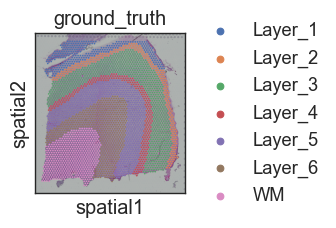

In [3]:
slice_id = "151676"
output_dir = "../output/App1-DLPFC/{}".format(slice_id)
adata = sc.read_h5ad("{}/adata_processed.h5ad".format(output_dir))
adata_raw = sc.read_h5ad("{}/adata_raw.h5ad".format(output_dir))
fig, ax = plt.subplots(figsize=(3.25, 3))
sc.pl.spatial(adata, basis="spatial", color="ground_truth", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, ax=ax)
# save to _figure
plt.tight_layout()
plt.savefig("{}/spatial_ground_truth.png".format(figure_dir), dpi=600)

# Benchmark simulation on full data

In [4]:
# load autoencoder and denoiser
n_rep = 5
autoencoder = torch.load("{}/autoencoder_attn2.pth".format(output_dir)).to(device)
denoiser = torch.load("{}/denoiser.pth".format(output_dir)).to(device)
adata_real_recon = get_recon(adata, autoencoder, apply_normalize=False, device=device)
adata_real_recon = get_recon(adata, autoencoder, apply_normalize=False, device=device)
normalizer = stutils.MinMaxNormalize(adata_real_recon.obsm["latent"], dim=0)
new_spatial = adata.obsm["spatial"].copy()
new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
adata.obsm["new_spatial"] = new_spatial

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.9998508764938737
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659386


In [8]:
data = pipeline.prepare_dataset(adata, ue_rep=None)

In [98]:
# Simulate 5 replicates through STADiffuser without labels
for seed in range(1, n_rep + 1):
    stadiff_sim = pipeline.simulate(denoiser, autoencoder, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    seed=seed, normarlizer=normalizer)
    # save to disk
    stadiff_sim.write_h5ad("{}/stadiff_{}.h5ad".format(output_dir, seed))

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [127]:
cond_name = "ground_truth"
num_class_embeds = len(np.unique(adata.obs[cond_name]))
class_dict = dict(zip(np.unique(adata.obs[cond_name]), range(num_class_embeds)))
print("Class encoding: ")
print(class_dict)
adata.obs["encoded_label"] = adata.obs[cond_name].map(class_dict)
denoiser_label = torch.load("{}/denoiser_ground_truth.pth".format(output_dir)).to(device)

Class encoding: 
{'Layer_1': 0, 'Layer_2': 1, 'Layer_3': 2, 'Layer_4': 3, 'Layer_5': 4, 'Layer_6': 5, 'WM': 6}


In [128]:
for i in range(1, 1 + n_rep):
    stadiff_sim = pipeline.simulate(denoiser_label, autoencoder, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    labels = adata.obs["encoded_label"].to_numpy(),
                                    seed=i, normarlizer=normalizer)
    stadiff_sim.write_h5ad("{}/stadiff_label_{}.h5ad".format(output_dir, i))

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

Simulate with labels


  0%|          | 0/1000 [00:00<?, ?it/s]

In [100]:
stadiff_sim_list = [sc.read_h5ad("{}/stadiff_{}.h5ad".format(output_dir, seed + 1)) for seed in range(5)]

In [129]:
stadiff_label_sim = [sc.read_h5ad("{}/stadiff_label_{}.h5ad".format(output_dir, seed + 1)) for seed in range(5)]

In [105]:
np.linalg.norm(stadiff_sim_list[0].X - stadiff_sim_list[4].X)

44.44184

In [130]:
np.linalg.norm(stadiff_label_sim[0].X - stadiff_label_sim[4].X)

82.69745

In [134]:
encode_labels = adata.obs["encoded_label"].to_numpy()
diff = 0
diff_label = 0
for i in np.unique(encode_labels):
    # compute the variance of the simulated within each class
    diff += np.linalg.norm(stadiff_sim_list[0].X[encode_labels == i] - stadiff_sim_list[4].X[encode_labels == i])
    diff_label += np.linalg.norm(stadiff_label_sim[0].X[encode_labels == i] - stadiff_label_sim[4].X[encode_labels == i])
print("Difference between 1st and 5th replicate: ", diff / len(np.unique(encode_labels)))
print("Difference between 1st and 5th replicate with label: ", diff_label / len(np.unique(encode_labels)))

Difference between 1st and 5th replicate:  16.128013474600657
Difference between 1st and 5th replicate with label:  30.114501953125


In [106]:
# concat the simulated data into a 3d tensor
simulated_data = np.stack([x.X for x in stadiff_sim_list], axis=0)

In [113]:
# compute the variance of the simulated data along the first axis
adata_real_recon.obs["sim_var"] = np.log(simulated_data.var(axis=0).sum(axis=1))

[<Axes: title={'center': 'sim_var'}, xlabel='spatial1', ylabel='spatial2'>]

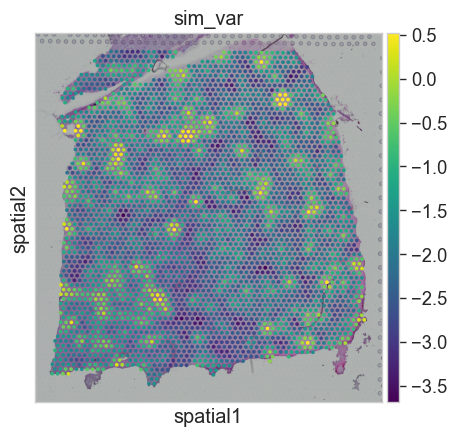

In [114]:
sc.pl.spatial(adata_real_recon, basis="spatial", color="sim_var", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, cmap="viridis", vmax="p99.5")

[<Axes: title={'center': 'sim_var'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'sim_label_var'}, xlabel='spatial1', ylabel='spatial2'>]

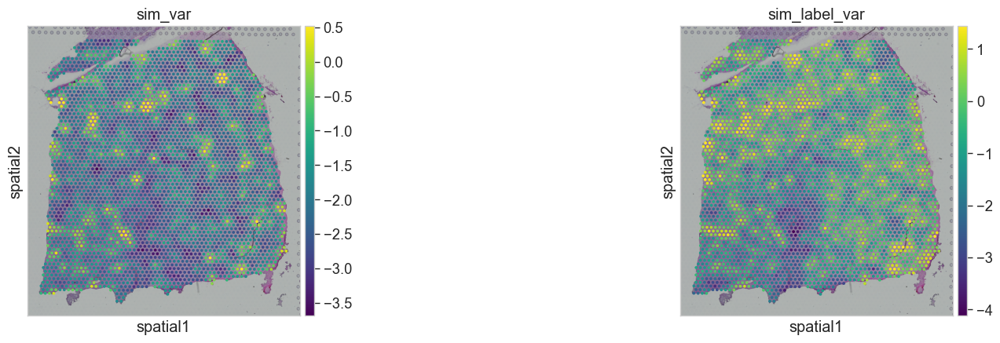

In [135]:
simulated_label_data = np.stack([x.X for x in stadiff_label_sim], axis=0)
adata_real_recon.obs["sim_label_var"] = np.log(simulated_label_data.var(axis=0).sum(axis=1))
sc.pl.spatial(adata_real_recon, basis="spatial", color=["sim_var", "sim_label_var"], ncols=2, frameon=True, wspace=0.4,
              use_raw=False, show=False, cmap="viridis", vmax="p99.5")

In [145]:
from scipy.special import softmax
raw_count = adata_raw.X.toarray()

# Compute softmax along rows
softmax_values = softmax(raw_count, axis=1)

# Replace zero values with a small positive value to avoid issues with logarithms
softmax_values[softmax_values == 0] = 1e-15

# Compute entropy for each row
entropy_values = -np.sum(softmax_values * np.log(softmax_values), axis=1)

In [530]:
# louvain clustering on the real_recon
sc.pp.neighbors(adata_real_recon, use_rep="latent")
sc.tl.louvain(adata_real_recon, key_added="louvain", resolution=0.3)

[<Axes: title={'center': 'log_entropy'}, xlabel='spatial1', ylabel='spatial2'>]

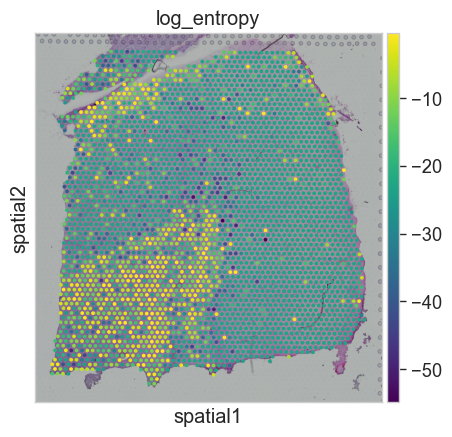

In [149]:
# visulaize the number of counts
adata_raw.obs["log_entropy"] = np.log(entropy_values)
sc.pl.spatial(adata_raw, basis="spatial", color="log_entropy", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, cmap="viridis", vmax="p99.5")

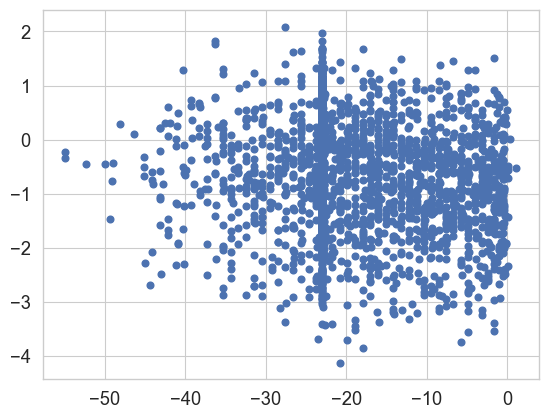

In [152]:
# plot n_counts vs sim_var
plt.plot(adata_raw.obs["log_entropy"], adata_real_recon.obs["sim_label_var"], "o")

## Compare with competing methods

In [194]:
comp_methods = ["splatter", "kersplatter", "zinb_spatial",  "scDesign_label", "SRT_domain", "stadiff", "stadiff_label"]
comp_sim_dict = dict()
for comp_method in comp_methods:
    adata_list = [sc.read_h5ad("{}/full_sim/{}_{}.h5ad".format(output_dir, comp_method, seed + 1)) for seed in range(n_rep)]
    comp_sim_dict[comp_method] = adata_list

In [200]:
simulated_data.var(axis=0).sum(axis=1)

array([0.1309616 , 0.39463788, 0.20196809, ..., 0.11725077, 1.5721109 ,
       1.0815293 ], dtype=float32)

In [202]:
def prep_count(adata):
    adata_ = adata.copy()
    adata_.X = adata_.X.toarray()
    sc.pp.normalize_total(adata_, target_sum=1e4)
    sc.pp.log1p(adata_)
    return adata_.X

In [214]:
# compute the variance of the simulated data along the first axis
for comp_method in comp_methods:
    if comp_method == "stadiff_label" or comp_method == "stadiff":
        simulated_data = np.stack([x.X for x in comp_sim_dict[comp_method]], axis=0)
        adata_real_recon.obs["{}_var".format(comp_method)] = simulated_data.var(axis=0).sum(axis=1)
    else:
        simulated_data = np.stack([prep_count(x) for x in comp_sim_dict[comp_method]], axis=0)
        adata_real_recon.obs["{}_var".format(comp_method)] = np.log(simulated_data.var(axis=0).sum(axis=1))

method: splatter p99.5: 7.53 mean: 7.44 min: 7.23
method: kersplatter p99.5: 7.46 mean: 7.36 min: 7.18
method: zinb_spatial p99.5: 7.65 mean: 7.11 min: 6.04
method: scDesign_label p99.5: 7.27 mean: 7.04 min: 6.77
method: SRT_domain p99.5: 5.44 mean: 4.80 min: 4.08
method: stadiff p99.5: 1.69 mean: 0.25 min: 0.02
method: stadiff_label p99.5: 4.23 mean: 0.82 min: 0.02


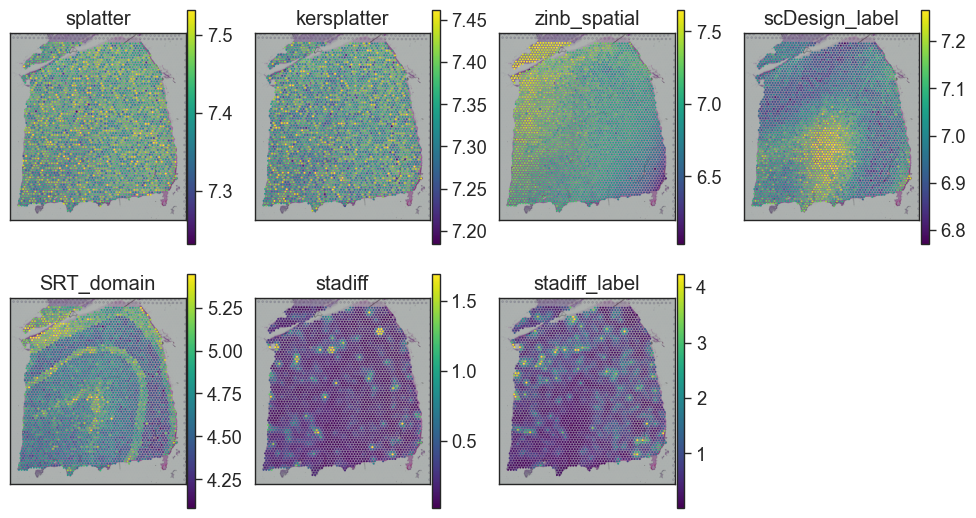

In [288]:
import scanpy as sc
import matplotlib.pyplot as plt
from _utils import *

# Assuming adata_real_recon and comp_methods are defined

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(10, 5.5), sharex=True, sharey=True)

# Loop through comp_methods and create subplots
for i, comp_method in enumerate(comp_methods):
    ax = axes.flatten()[i]
    sc.pl.spatial(adata_real_recon, basis="spatial", color="{}_var".format(comp_method), ncols=1, frameon=True, wspace=0.4,
                  use_raw=False, show=False, cmap="viridis", vmax="p99.5", ax=ax)
    ax.set_title(comp_method)
    ax.set_xlabel("")
    ax.set_ylabel("")
    #
    print("method:", comp_method,
          "p99.5: {:.2f}".format(np.percentile(adata_real_recon.obs["{}_var".format(comp_method)], 99.5)),
          "mean: {:.2f}".format(adata_real_recon.obs["{}_var".format(comp_method)].mean()),
          "min: {:.2f}".format(adata_real_recon.obs["{}_var".format(comp_method)].min()))
# hide the last axis
axes.flatten()[-1].axis("off")
plt.tight_layout()

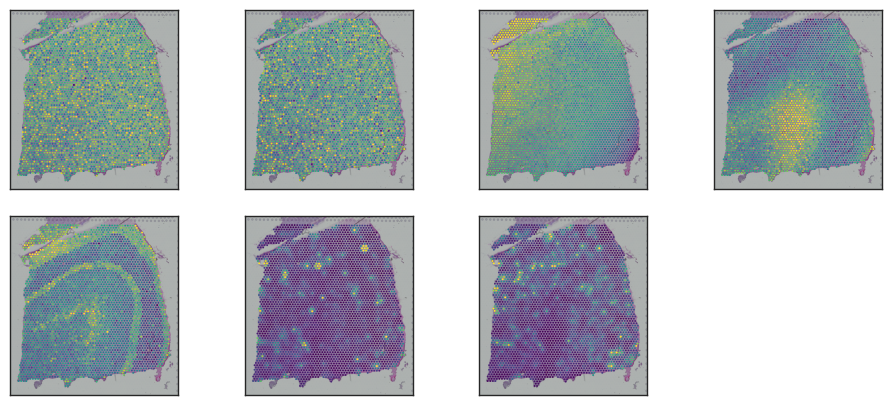

In [309]:
fig, axes = plt.subplots(2, 4, figsize=(11.5, 5), sharex=True, sharey=True)

# Loop through comp_methods and create subplots
for i, comp_method in enumerate(comp_methods):
    ax = axes.flatten()[i]
    sc.pl.spatial(adata_real_recon, basis="spatial", color="{}_var".format(comp_method), ncols=1, frameon=True, wspace=0.4,
                  use_raw=False, show=False, cmap="viridis", vmax="p99.5", ax=ax)
    ax.set_title(comp_method)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")
    # remove colorbar
    ax.collections[0].colorbar.remove()
# hide the last axis
axes.flatten()[-1].axis("off")
# adjust verstical margin
plt.subplots_adjust(wspace=0.25, hspace=0.15)

In [248]:
method_palette = {
    'splatter':  '#1f78b4',  # Blue
    'kersplatter': '#a6cee3',  # Lighter blue
    'zinb_spatial': "#ff7f0e",  # coral
    'SRT_domain':  '#33a02c',  # Green
    'scDesign_label': '#6a3d9a',  # Purple
    'stadiff': '#e31a1c',  #red
    "stadiff_label": "#fb9a99", #lighter red
}

In [323]:
import itertools
def compute_sim_perf(sim_adata_list, autoencoder, adata_raw, adata_real_recon,
                     enhanced = False,
                     n_rep=5,
                     device="cuda:0"):
    sim_perf = dict()
    metric_names = ["cell_corr", "enhanced_cell_corr", "pairwise_cell_corr", "pairwise_enhanced_cell_corr"]
    metric_names += ["gene_corr", "enhanced_gene_corr", "pairwise_gene_corr", "pairwise_enhanced_gene_corr"]
    for name in metric_names:
        sim_perf[name] = []
    if not enhanced:
        adata_sim_recon_list = []
    else:
        adata_sim_recon_list = sim_adata_list
    for ind in range(n_rep):
        adata_sim = sim_adata_list[ind]
        if not enhanced:
            adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
            adata_sim_recon_list.append(adata_sim_recon)
        else:
            adata_sim_recon = adata_sim
        for dim in ["cell", "gene"]:
            sim_perf[dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim, adata_raw, dim=dim)))
            sim_perf["enhanced_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim_recon, adata_real_recon, dim=dim)))

    for (i, j) in itertools.combinations(range(n_rep), 2):
        for dim in ["cell", "gene"]:
            sim_perf["pairwise_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(sim_adata_list[i], sim_adata_list[j], dim=dim)))
            sim_perf["pairwise_enhanced_" + dim + "_corr"].append(np.nanmean(metrics.compute_corr(adata_sim_recon_list[i], adata_sim_recon_list[j], dim=dim)))
    return sim_perf

In [342]:
gene_corr = dict()
for sim_name in comp_sim_dict:
    sim_adata = comp_sim_dict[sim_name][0].copy()
    sim_adata.uns["spatial_net"] = adata_real_recon.uns["spatial_net"]
    if sim_name == "stadiff_label" or sim_name == "stadiff":
        sim_adata_recon = sim_adata

    else:
        sim_adata.obs_names = adata.obs_names
        sim_adata.var_names = adata.var_names
        sim_adata.X = sim_adata.X.toarray()
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sim_adata_recon = get_recon(sim_adata, autoencoder, device=device, use_net="spatial_net")
    gene_corr[sim_name] = metrics.compute_corr(sim_adata_recon, adata_real_recon, dim="gene")

### Plot gene correlation

[Text(0, 0, ''),
 Text(1, 0, ''),
 Text(2, 0, ''),
 Text(3, 0, ''),
 Text(4, 0, ''),
 Text(5, 0, '')]

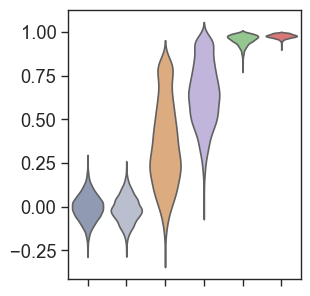

In [413]:
gene_corr_df = pd.DataFrame(gene_corr)
plot_methods = comp_methods[:-1]
gene_corr_df = gene_corr_df[plot_methods].melt(var_name="method", value_name="correlation")
# plot boxplot for gene correlation
fig, ax = plt.subplots(1, 1, figsize=(3, 3.5))
# plot violin plot with edge color different and filling is blank
sns.violinplot(x="method", y="correlation", data=gene_corr_df, ax=ax,  scale='width',
               inner=None, palette={method: method_palette[method] for method in plot_methods},
               color={method: method_palette[method] for method in plot_methods}, fill=False)
# set x label to empty and x axis to empty
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])

In [347]:
comp_perf_dict = dict()
adata_raw.X = adata_raw.X.toarray()
for name in comp_methods:
    print("==== {} ====".format(name))
    adata_list = comp_sim_dict[name]
    if name == "stadiff_label" or name == "stadiff":
        comp_perf_dict[sim_name] = compute_sim_perf(comp_sim_dict[sim_name], autoencoder, adata_raw, adata_real_recon,
                                                    enhanced=True, n_rep=5, device=device)
    else:
        adata_temp_list = []
        for a in adata_list:
            a = a.copy()
            a.X = a.X.toarray()
            a.uns["spatial_net"] = adata.uns["spatial_net"]
            a.obsm["spatial"] = adata.obsm["spatial"]
            # set obs_name
            a.obs_names = adata.obs_names
            adata_temp_list.append(a)
        adata_list = adata_temp_list
        comp_perf_dict[name] = compute_sim_perf(adata_list, autoencoder, adata_raw, adata_real_recon,
                                               enhanced=False, n_rep=5, device=device)

==== splatter ====
==== kersplatter ====
==== zinb_spatial ====
==== scDesign_label ====
==== SRT_domain ====
==== stadiff ====
==== stadiff_label ====


In [354]:
metric_names = ["cell_corr", "enhanced_cell_corr", "pairwise_cell_corr", "pairwise_enhanced_cell_corr"]
metric_names += ["gene_corr", "enhanced_gene_corr", "pairwise_gene_corr", "pairwise_enhanced_gene_corr"]
perf_df = []
for sim_name in comp_methods:
    perf_df.append([np.nanmean(comp_perf_dict[sim_name][name]) for name in metric_names])
perf_df = pd.DataFrame(perf_df, index=comp_methods, columns=metric_names)
for group in ["cell", "gene"]:
    perf_df["enhanced_" + group + "_diversity"] = 1 - perf_df["pairwise_enhanced_" + group + "_corr"]
    perf_df[group + "_diversity"] = 1 - perf_df["pairwise_" + group + "_corr"]

#### Plot diversity v.s. fidelity

Text(0, 0.5, '')

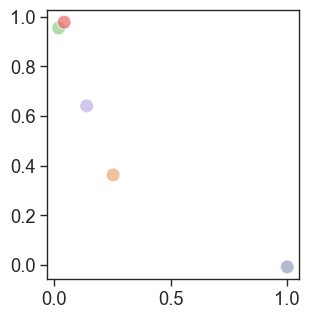

In [469]:
perf_df_drop = perf_df.loc[plot_methods]
markers = ["v", "^", "o", "s", "D", "P"]
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
# set color palette
perf_df_drop["method"] = perf_df_drop.index
sns.scatterplot(data=perf_df_drop, x="enhanced_gene_diversity", y="enhanced_gene_corr",
                hue="method",
                ax=ax,
                style="method",
                palette={method: method_palette[method] for method in comp_methods},
                markers = "o",
                alpha=0.7,
                legend=False, s=100)
# ax.set_ylim(0.2, 1)
ax.set_xlabel("")
ax.set_ylabel("")
# set tick font size to 7
# save figure to file

### Plot mLSI barplot

In [382]:
for method_name in comp_methods:
    print("Method: ", method_name)
    comp_perf_dict[method_name]["mLISI"] = []
    adata_sim = comp_sim_dict[method_name][0]
    if method_name == "stadiff_label" or method_name == "stadiff":
        adata_sim_recon = adata_sim
    else:
        adata_sim = adata_sim.copy()
        adata_sim.X = adata_sim.X.toarray()
        adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
        adata_sim.obsm["spatial"] = adata.obsm["spatial"]
        adata_sim.obs_names = adata.obs_names
        adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
    comp_perf_dict[method_name]["mLISI"].append(metrics.compute_paired_lisi(adata_sim_recon, adata_real_recon))

Method:  splatter
Method:  kersplatter
Method:  zinb_spatial
Method:  scDesign_label
Method:  SRT_domain
Method:  stadiff
Method:  stadiff_label


[Text(0, 0, ''),
 Text(1, 0, ''),
 Text(2, 0, ''),
 Text(3, 0, ''),
 Text(4, 0, ''),
 Text(5, 0, '')]

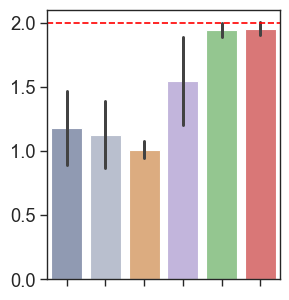

In [412]:
# plot barplot for mLISI
mLISI_df = []
# add column to mLISI_df
for sim_name in plot_methods:
    mLISI_df.append(comp_perf_dict[sim_name]["mLISI"][0])
# convert to dataframe
mLISI_df = np.array(mLISI_df).squeeze().T
mLISI_df = pd.DataFrame(mLISI_df, columns=plot_methods)
fig, ax = plt.subplots(1, 1, figsize=(3, 3.5))
sns.barplot(data=mLISI_df, ax=ax,
            palette={method: method_palette[method] for method in plot_methods}, ci="sd")
# set a horizontal line at 2
ax.axhline(2, color="red", linestyle="--")
# set x label to empty and x axis to empty
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])

###  Compare latent embedding

In [9]:
import scipy
from scipy.stats import spearmanr, pearsonr

def plot_umap(adata, latent, title=None, ax=None, frameon=False, seed=None):
    # if x is not torch tensor, convert it to torch tensor
    # if x is sparse matrix, convert it to numpy
    # set seed
    if seed is not None:
        np.random.seed(seed)
    adata.obsm["latent"] = latent
    sc.pp.neighbors(adata, use_rep="latent", n_neighbors=30)
    sc.tl.umap(adata, min_dist=0.5)
    sc.pl.umap(adata, color=["ground_truth"], ncols=1, frameon=frameon, wspace=0.4,
               use_raw=False, show=False, title=title, ax=ax, legend_loc='none')

In [475]:
adata_temp = adata.copy()
for method_name in comp_methods:
    adata_sim = comp_sim_dict[method_name][0]
    if method_name == "stadiff_label" or method_name == "stadiff":
        adata_sim_recon = adata_sim
        adata_temp.uns[method_name + "_recon"] = adata_sim_recon.X
        adata_temp.obsm[method_name + "_latent"] = adata_sim_recon.obsm["latent"]
    else:
        adata_sim = adata_sim.copy()
        adata_sim.X = adata_sim.X.toarray()
        adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
        adata_sim.obsm["spatial"] = adata.obsm["spatial"]
        adata_sim.obs_names = adata.obs_names
        adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
        adata_temp.uns[method_name + "_recon"] = adata_sim_recon.X
        adata_temp.obsm[method_name + "_latent"] = adata_sim_recon.obsm["latent"]

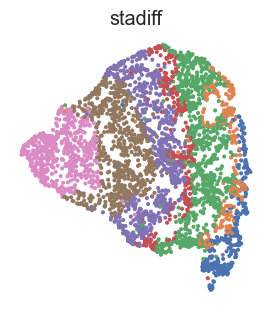

In [481]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
method_name = "stadiff"
plot_umap(adata_temp, adata_temp.obsm[method_name + "_latent"], title=method_name, ax=ax, frameon=False)

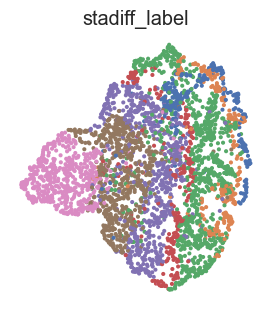

In [490]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.5))
method_name = "stadiff_label"
adata_sim = comp_sim_dict[method_name][2]
plot_umap(adata_temp, adata_temp.obsm[method_name + "_latent"], title=method_name, ax=ax, frameon=False)

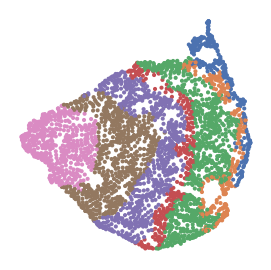

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
method_name = "ground_truth"
plot_umap(adata_real_recon, adata_real_recon.obsm["latent"], title=method_name, ax=ax, frameon=False)
ax.set_title("")
# save figure to file
fig.savefig("{}/umap_full.png".format(figure_dir), dpi=600)

In [90]:
adata_real_recon

AnnData object with n_obs × n_vars = 3431 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'ground_truth', 'circle-1', 'circle-2', 'circle-3', 'rectangle-1', 'rectangle-2', 'rectangle-3', 'extrapolation-1', 'extrapolation-2', 'extrapolation-3', 'random_0.05', 'random_0.1', 'random_0.2', 'random_0.3', 'random_0.4', 'random_0.5', 'random_0.6', 'random_0.8', 'random_0.9', 'strip'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ground_truth_colors', 'hvg', 'log1p', 'spatial', 'spatial_net', 'edge_list', 'neighbors', 'umap'
    obsm: 'spatial', 'new_spatial', 'latent', 'X_umap'
    obsp: 'distances', 'connectivities'

In [495]:
metrics.compute_paired_lisi(comp_sim_dict["stadiff_label"][0], adata_real_recon).mean()

1.9441124081853582

In [500]:
adata_sim = comp_sim_dict["SRT_domain"][0]
adata_sim = adata_sim.copy()
adata_sim.X = adata_sim.X.toarray()
adata_sim.uns["spatial_net"] = adata.uns["spatial_net"]
adata_sim.obsm["spatial"] = adata.obsm["spatial"]
adata_sim.obs_names = adata.obs_names
adata_sim_recon = get_recon(adata_sim, autoencoder, device=device, use_net="spatial_net")
metrics.compute_paired_lisi(adata_sim_recon, adata_real_recon).mean()

1.9449868886579293

# Benchmark on masking data

In [36]:
from stadiffuser.utils import mask_region
adata = sc.read_h5ad("../output/App1-DLPFC/{}/adata_processed.h5ad".format("151676"))
adata_raw = sc.read_h5ad("../output/App1-DLPFC/{}/adata_raw.h5ad".format("151676"))
mask = "circle-2"
denoiser_masked = torch.load("{}/{}/denoiser.pth".format(output_dir, mask), map_location="cuda:0")
autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
new_spatial = adata.obsm["spatial"].copy()
new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
adata.obsm["new_spatial"] = new_spatial
adata_masked = mask_region(adata, mask)
adata_masked_recon = get_recon(adata_masked, autoencoder_masked, device=device, use_net="spatial_net",
                               apply_normalize=False)
normalizer = stutils.MinMaxNormalize(adata_masked_recon.obsm["latent"], dim=0)
data = pipeline.prepare_dataset(adata, device=device, use_net="spatial_net")

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.9998508764938737
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659386
--------------------
Remove 123 nodes and 820 edges from the original data


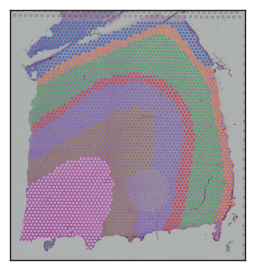

In [37]:
adata_temp = adata.copy()
# set masked ground truth to None
adata_temp.obs["ground_truth"][~adata_temp.obs[mask]] = None
# plot the masked ground truth
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
sc.pl.spatial(adata_temp, basis="spatial", color="ground_truth", ncols=1, frameon=True, wspace=0.4,
              use_raw=False, show=False, ax=ax, legend_loc='none')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title("")
# save to disk
fig.savefig("{}/masked_{}_ground_truth.png".format(figure_dir, mask), dpi=600)

In [38]:
# simulate
n_rep = 5
for i in range(1, n_rep+1):
    adata_sim = pipeline.simulate(denoiser_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                    ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                    seed=i, normarlizer=normalizer)
    adata_sim.write_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i))

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [39]:
stadiff_reccon_list = [sc.read_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i)) for i in range(1, n_rep+1)]
srt_recon_list = []
for i in range(1, n_rep + 1):
    adata_srt = sc.read_h5ad(os.path.join(output_dir, mask) + "/SRTSim_fill_inplace{}.h5ad".format(i))
    adata_srt.obsm["spatial"] = adata.obsm["spatial"]
    adata_srt.uns["spatial_net"] = adata.uns["spatial_net"]
    adata_srt.obs_names = adata.obs_names
    adata_srt.obs["ground_truth"] = adata.obs["ground_truth"]
    adata_srt_recon = get_recon(adata_srt, autoencoder_masked, device=device, use_net="spatial_net",
                                   apply_normalize=True)
    srt_recon_list.append(adata_srt_recon)

## Visualize umap

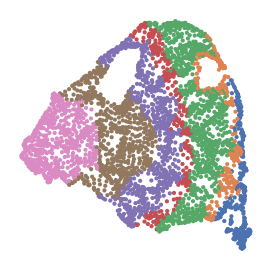

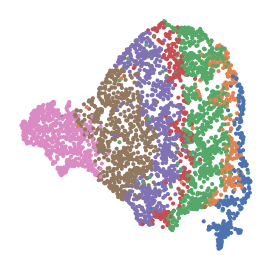

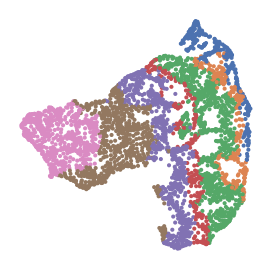

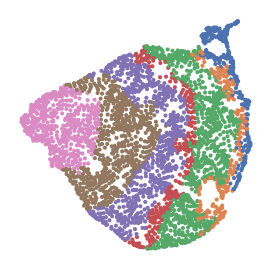

In [40]:
# visulize by umap
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(adata_masked, adata_masked_recon.obsm["latent"], title="masked", ax=ax, frameon=False, seed=2024)
ax.set_title("")
plt.savefig("{}/umap_{}.png".format(figure_dir, mask), dpi=600)
# plot umap for stadiff
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(stadiff_reccon_list[0], stadiff_reccon_list[0].obsm["latent"], title="", ax=ax, frameon=False, seed=42)
plt.savefig("{}/umap_{}_stadiff.png".format(figure_dir, mask), dpi=600)
# plot umap for srt
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(srt_recon_list[0], srt_recon_list[0].obsm["latent"], title="", ax=ax, frameon=False, seed=2024)
plt.savefig("{}/umap_{}_srt.png".format(figure_dir, mask), dpi=600)
# plot umap for ground truth
fig, ax = plt.subplots(1, 1, figsize=(3.25, 3.25))
plot_umap(adata_real_recon, adata_real_recon.obsm["latent"], title="", ax=ax, frameon=False, seed=2024)

In [48]:
srt_lsi = metrics.compute_paired_lisi(srt_recon_list[0], adata_real_recon, use_rep="X_umap")
stadiff_lsi = metrics.compute_paired_lisi(stadiff_reccon_list[0], adata_real_recon, use_rep="X_umap")
print("STADiffuser mLSI: {:.3f} ({:.3f})".format(stadiff_lsi.mean(), stadiff_lsi.std()))
print("SRTSim      mLSI: {:.3f} ({:.3f})".format(srt_lsi.mean(), srt_lsi.std()))
# write the information to file
with open("{}/{}/summary.txt".format(output_dir, mask), "w") as f:
    f.write("STADiffuser mLSI: {:.3f} ({:.3f})\n".format(stadiff_lsi.mean(), stadiff_lsi.std()))
    f.write("SRTSim      mLSI: {:.3f} ({:.3f})\n".format(srt_lsi.mean(), srt_lsi.std()))

STADiffuser mLSI: 1.721 (0.308)
SRTSim      mLSI: 1.665 (0.331)


In [43]:
def upside_down(adata):
    adata_ = adata.copy()
    adata_.obsm["spatial"][:, 1] = -adata_.obsm["spatial"][:, 1]
    return adata_

def plot_gene_recon(adata_raw, adata_real_recon, adata_srt, adata_stadiff,
                    gene_name, figsize=(12, 3), vmax="p99.5"):
    # Plot raw data
    fig, axes = plt.subplots(1, 4, figsize=figsize)
    sc.pl.embedding(upside_down(adata_raw), basis="spatial", color=gene_name, ax=axes[0],
                    show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
    axes[0].collections[0].colorbar.remove()
    axes[0].set_title("")
    # Plot real reconstruction
    sc.pl.embedding(upside_down(adata_real_recon), basis="spatial", color=gene_name, ax=axes[1],
                    show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
    axes[1].collections[0].colorbar.remove()
    axes[1].set_title("")

    # Plot reconstructions from srt_recon_list and stadiff_reccon_list
    for ind, sim_recon in enumerate([adata_srt, adata_stadiff]):
        sim_recon.obsm["spatial"] = adata_real_recon.obsm["spatial"]
        sim_recon.var_names = adata_real_recon.var_names
        sc.pl.embedding(upside_down(sim_recon), basis="spatial", color=gene_name, ax=axes[ind + 2],
                        show=False, wspace=0.4, frameon=False, cmap="viridis", vmax=vmax)
        axes[ind + 2].collections[0].colorbar.remove()
        axes[ind + 2].set_title("")
    return fig

## Plot representative genes

In [49]:
stadiff_corr = metrics.compute_corr(stadiff_reccon_list[0], adata_real_recon, dim="gene")
srt_corr = metrics.compute_corr(srt_recon_list[0], adata_real_recon, dim="gene")

B3GALT2 0.9492379129598709 0.8595526026673218
KRT17 0.9651153696818409 0.8542706129710527


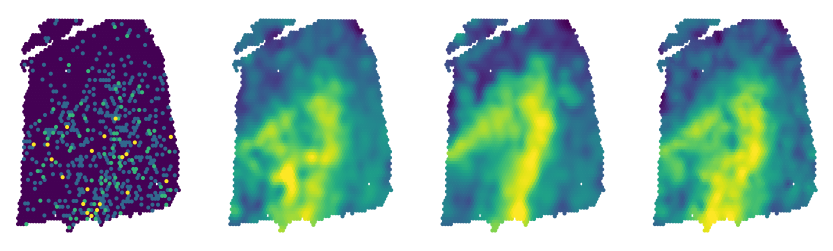

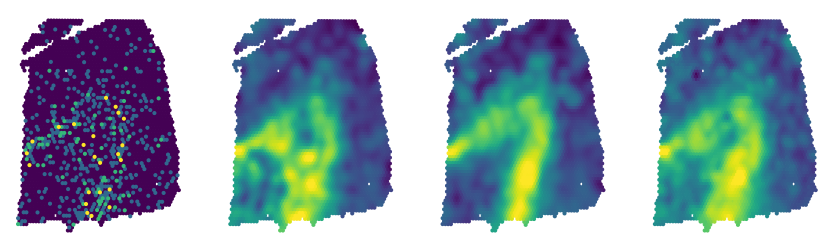

In [53]:
gene_names = ["B3GALT2", "KRT17"]
for gene_name in gene_names:
    gene_index = np.where(adata_real_recon.var_names == gene_name)[0][0]
    print(gene_name, stadiff_corr[gene_index], srt_corr[gene_index])
    fig = plot_gene_recon(adata_raw, adata_real_recon, srt_recon_list[0], stadiff_reccon_list[0], gene_name, figsize=(10.5, 3))
    # save to file
    fig.savefig("{}/{}_{}_recon.png".format(figure_dir, mask, gene_name), dpi=600)
    with open("{}/{}/summary.txt".format(output_dir, mask), "a") as f:
        f.write("{}: {:.3f} ({:.3f})\n".format(gene_name, stadiff_corr[gene_index], srt_corr[gene_index]))

In [54]:
result_lsi = pd.DataFrame({"lsi": stadiff_lsi[:, 0],
                           "method": "STADiffuser"})
result_lsi = result_lsi.append(pd.DataFrame({"lsi": srt_lsi[:, 0],
                                            "method": "SRTSim"}, index=result_lsi.index))
# add a column form mask
result_lsi["mask"] = mask
result_lsi.to_csv("{}/{}/lsi.csv".format(output_dir, mask), index=False)
result_gene_corr = pd.DataFrame({"gene_corr": stadiff_corr,
                                 "method": "STADiffuser"})
result_gene_corr = result_gene_corr.append(pd.DataFrame({"gene_corr": srt_corr,
                                                        "method": "SRTSim"}, index=result_gene_corr.index))
result_gene_corr["mask"] = mask
result_gene_corr.to_csv("{}/{}/gene_corr.csv".format(output_dir, mask), index=False)

## Compare LSI and gene correlation between STADiffuser and SRTSim

In [56]:
mask_names = ["random_0.1", "circle-2", "rectangle-1", "strip"]
# load lsi from disk
result_lsi = []
result_gene_corr = []
for mask in mask_names:
    print(mask)
    result_lsi.append(pd.read_csv("{}/{}/lsi.csv".format(output_dir, mask)))
    result_gene_corr.append(pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask)))

random_0.1
circle-2
rectangle-1
strip


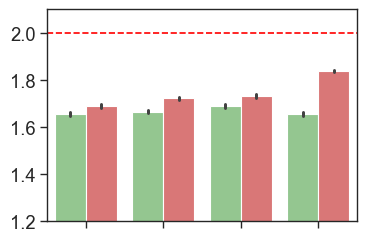

In [58]:
# plot lsi barplot
plot_palette = {"STADiffuser": method_palette["stadiff"],
                "SRTSim": method_palette["SRT_domain"]}
fig, ax = plt.subplots(1, 1, figsize=(4, 2.75))
sns.barplot(data=pd.concat(result_lsi), x="mask", y="lsi", hue="method", ax=ax,
            order=["random_0.1", "circle-2", "rectangle-1", "strip"],
            palette=plot_palette, ci=95, hue_order=["SRTSim", "STADiffuser"])
ax.set_ylim(1.2, 2.1)
ax.axhline(2, color="red", linestyle="--")
# set legend to none
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
# save to fig
fig.savefig("{}/lsi_barplot.png".format(figure_dir), dpi=600)

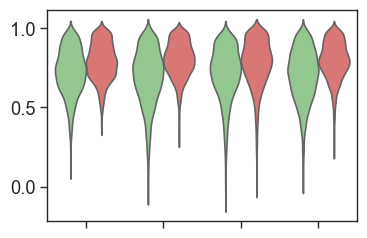

In [59]:
# plot the gene correlation violin plot
fig, ax = plt.subplots(1, 1, figsize=(4, 2.75))
gene_corr_df = pd.concat(result_gene_corr)
sns.violinplot(data=gene_corr_df, x="mask", y="gene_corr", hue="method", ax=ax, hue_order=["SRTSim", "STADiffuser"],
               order=["random_0.1", "circle-2", "rectangle-1", "strip"],
               palette=plot_palette, inner=None, scale="width", fill=False)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels([])
# remove legend
ax.legend().remove()
# save to file
fig.savefig("{}/gene_corr_violin.png".format(figure_dir), dpi=600)

In [158]:
# compute the p-value
# compute the p-value
print("STADiffuser vs SRTSim mLSI")
for mask in mask_names:
    print(mask)
    result_lsi = pd.read_csv("{}/{}/lsi.csv".format(output_dir, mask))
    print(scipy.stats.ttest_rel(result_lsi[result_lsi["method"] == "STADiffuser"]["lsi"],
                                result_lsi[result_lsi["method"] == "SRTSim"]["lsi"]))
print("STADiffuser vs SRTSim gene correlation")
for mask in mask_names:
    print(mask)
    result_gene_corr = pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask))
    print(scipy.stats.ttest_rel(result_gene_corr[result_gene_corr["method"] == "STADiffuser"]["gene_corr"],
                                result_gene_corr[result_gene_corr["method"] == "SRTSim"]["gene_corr"]))

circle-1
TtestResult(statistic=56.44499125054376, pvalue=0.0, df=2999)
rectangle-1
TtestResult(statistic=37.50772475073175, pvalue=8.273851399583425e-253, df=2999)
strip
TtestResult(statistic=51.23203843859228, pvalue=0.0, df=2999)


In [60]:
# print mean correlation
for mask in mask_names:
    print(mask)
    result_gene_corr = pd.read_csv("{}/{}/gene_corr.csv".format(output_dir, mask))
    print(result_gene_corr.groupby("method")["gene_corr"].mean())

random_0.1
method
SRTSim         0.725671
STADiffuser    0.788132
Name: gene_corr, dtype: float64
circle-2
method
SRTSim         0.691791
STADiffuser    0.801866
Name: gene_corr, dtype: float64
rectangle-1
method
SRTSim         0.711751
STADiffuser    0.777272
Name: gene_corr, dtype: float64
strip
method
SRTSim         0.703950
STADiffuser    0.794223
Name: gene_corr, dtype: float64


## Super resolution

In [80]:
missing_rates = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]
n_rep = 5
for missing_rate in missing_rates:
    print("Missing rate: ", missing_rate)
    mask = "random_{}".format(missing_rate)
    denoiser_masked = torch.load("{}/{}/denoiser.pth".format(output_dir, mask), map_location="cuda:0")
    autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, mask), map_location="cuda:0").to(device)
    new_spatial = adata.obsm["spatial"].copy()
    new_spatial = stutils.quantize_coordination(new_spatial, methods=[("division", 125), ("division", 125)])
    adata.obsm["new_spatial"] = new_spatial
    adata_masked = mask_region(adata, mask)
    adata_masked_recon = get_recon(adata_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                   apply_normalize=False)
    normalizer = stutils.MinMaxNormalize(adata_masked_recon.obsm["latent"], dim=0)
    data = pipeline.prepare_dataset(adata, device=device, use_net="spatial_net")
    # simulate
    for i in range(1, n_rep+1):
        adata_sim = pipeline.simulate(denoiser_masked, autoencoder_masked, device=device, use_net="spatial_net",
                                      ref_data=adata, spatial_coord=adata.obsm["new_spatial"],
                                      seed=i, normarlizer=normalizer)
        adata_sim.write_h5ad("{}/{}/stadiff_{}.h5ad".format(output_dir, mask, i))

Missing rate:  0.8
Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500588749635675, pearson correlation: 0.9998508764938737
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.25002856310113675, pearson correlation: 0.9998722429659386
--------------------
Remove 2741 nodes and 19174 edges from the original data


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [82]:
stadiff_sim_list = []
srt_sim_list = []
srt_sim_recon_list = []
for missing_rate in missing_rates:
    print("Missing rate: ", missing_rate)
    mask = "random_{}".format(missing_rate)
    stadiff_sim = sc.read_h5ad("{}/{}/stadiff_1.h5ad".format(output_dir, mask))
    srt_sim = sc.read_h5ad("{}/{}/SRTSim_fill_inplace1.h5ad".format(output_dir, mask))
    # add spatial information
    srt_sim.obsm["spatial"] = adata.obsm["spatial"]
    srt_sim.uns["spatial_net"] = adata.uns["spatial_net"]
    srt_sim.obs_names = adata.obs_names
    srt_sim.obs["ground_truth"] = adata.obs["ground_truth"]
    srt_sim_recon = get_recon(srt_sim, autoencoder_masked, device=device, use_net="spatial_net",
                               apply_normalize=True)
    stadiff_sim_list.append(stadiff_sim)
    srt_sim_list.append(srt_sim)
    srt_sim_recon_list.append(srt_sim_recon)

Missing rate:  0.1
Missing rate:  0.2
Missing rate:  0.3
Missing rate:  0.4
Missing rate:  0.5
Missing rate:  0.6
Missing rate:  0.8


In [83]:
# compute gene correlation
for ind in range(len(stadiff_sim_list)):
    sc.pp.neighbors(stadiff_sim_list[ind], use_rep="latent", n_neighbors=30)
    sc.tl.umap(stadiff_sim_list[ind], min_dist=0.5)
    sc.pp.neighbors(srt_sim_recon_list[ind], use_rep="latent", n_neighbors=30)
    sc.tl.umap(srt_sim_recon_list[ind], min_dist=0.5)
stadiff_corr_list = [metrics.compute_corr(stadiff_sim, adata_real_recon, dim="gene") for stadiff_sim in stadiff_sim_list]
srt_corr_list = [metrics.compute_corr(srt_sim_recon, adata_real_recon, dim="gene") for srt_sim_recon in srt_sim_recon_list]
stadiff_lsi_list = [metrics.compute_paired_lisi(stadiff_sim, adata_real_recon, use_rep="X_umap") for stadiff_sim in stadiff_sim_list]
srt_lsi_list = [metrics.compute_paired_lisi(srt_sim_recon, adata_real_recon, use_rep="X_umap") for srt_sim_recon in srt_sim_recon_list]

In [359]:
gene_corr_df = pd.DataFrame(np.array(stadiff_corr_list).T)
# 3000 genes with respect to the seven missing rates
gene_corr_df = gene_corr_df.set_index(adata.var_names)
# set column names
gene_corr_df.columns = missing_rates
gene_corr_df["method"] = "STADiffuser"
# append srt_corr_list
srt_corr_df = pd.DataFrame(np.array(srt_corr_list).T)
srt_corr_df = srt_corr_df.set_index(adata.var_names)
srt_corr_df.columns = missing_rates
srt_corr_df["method"] = "SRTSim"
# append to gene_corr_df
gene_corr_df = gene_corr_df.append(srt_corr_df)
# metlt the dataframe
gene_corr_df = gene_corr_df.melt(id_vars=["method"], var_name="missing_rate", value_name="gene_corr")
srt_lsi_df = pd.DataFrame(np.concatenate(stadiff_lsi_list, axis=1))
srt_lsi_df.columns = missing_rates
srt_lsi_df["method"] = "SRTSim"
stadiff_lsi_df = pd.DataFrame(np.concatenate(srt_lsi_list, axis=1))
stadiff_lsi_df.columns = missing_rates
stadiff_lsi_df["method"] = "STADiffuser"
# append to gene_corr_df
lsi_df = srt_lsi_df.append(stadiff_lsi_df)
del srt_lsi_df, stadiff_lsi_df
# metlt the dataframe
lsi_df = lsi_df.melt(id_vars=["method"], var_name="missing_rate", value_name="lsi")

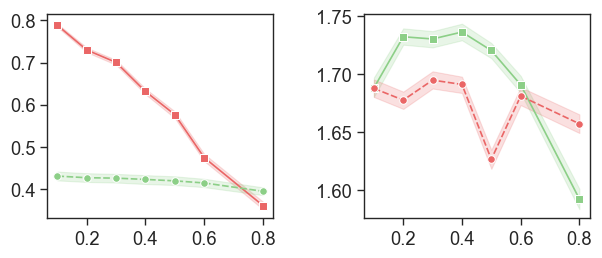

In [379]:
# plot the gene correlation lineplot with mean and std
fig, axes = plt.subplots(1, 2, figsize=(7, 2.65))
#plot the gene correlation lineplot
ax = axes[0]
sns.lineplot(data=gene_corr_df, x="missing_rate", y="gene_corr", hue="method", ax=ax,
             palette=plot_palette, markers=["s", "o"], style="method", ci=95, markersize=5.5)
# remove legend
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
# plot mLISI lineplot
ax = axes[1]
sns.lineplot(data=lsi_df, x="missing_rate", y="lsi", hue="method", ax=ax,
             palette=plot_palette, markers=["s", "o"], style="method", ci=95, markersize=5.5)
# remove legend
ax.legend().remove()
ax.set_xlabel("")
ax.set_ylabel("")
plt.subplots_adjust(wspace=0.4)
# save to disk
fig.savefig("{}/mLSI_and_corr_varying_missing_rate.png".format(figure_dir), dpi=300)

In [354]:
#
gene_corr_df = pd.DataFrame(np.array(stadiff_corr_list).T)
# 3000 genes with respect to the seven missing rates
gene_corr_df = gene_corr_df.set_index(adata.var_names)
# set column names
gene_corr_df.columns = missing_rates
gene_nonzero_rate = np.array((adata_raw.X > 0).sum(axis=0) / adata_raw.X.shape[0]).flatten()
gene_corr_df["slope"] = gene_corr_df.apply(lambda x: np.polyfit(missing_rates, x, 1)[0], axis=1)
gene_corr_df["method"] = "STADiffuser"
gene_corr_df["gene_nonzero_rate"] = np.log(1 + gene_nonzero_rate)
# append srt_corr_list
srt_corr_df = pd.DataFrame(np.array(srt_corr_list).T)
srt_corr_df = srt_corr_df.set_index(adata.var_names)
srt_corr_df.columns = missing_rates
srt_corr_df["slope"] = srt_corr_df.apply(lambda x: np.polyfit(missing_rates, x, 1)[0], axis=1)
srt_corr_df["method"] = "SRTSim"
srt_corr_df["gene_nonzero_rate"] = np.log(1 + gene_nonzero_rate)

# append to gene_corr_df
gene_corr_df = gene_corr_df.append(srt_corr_df)
gene_corr_df
# apply linear regression to compute the slope

,0.1,0.2,0.3,0.4,0.5,0.6,0.8,slope,method,gene_nonzero_rate
AL669831.5,0.708869,0.743418,0.703899,0.613265,0.676613,0.437648,0.205348,-0.725302,STADiffuser,0.019911
SAMD11,0.775277,0.687221,0.689024,0.540684,0.502347,0.308129,0.375509,-0.666344,STADiffuser,0.007549
KLHL17,0.762424,0.708384,0.681847,0.310508,0.230991,0.113897,0.110533,-1.119400,STADiffuser,0.029296
ISG15,0.917254,0.871585,0.877139,0.853505,0.855392,0.791679,0.554961,-0.439175,STADiffuser,0.213126
AL390719.2,0.743039,0.701337,0.737176,0.614560,0.569152,0.476579,-0.118401,-1.105133,STADiffuser,0.005233
...,...,...,...,...,...,...,...,...,...,...
MT-ATP8,0.806531,0.800602,0.801457,0.788198,0.779802,0.776217,0.736648,-0.093994,SRTSim,0.634788
MT-ND3,0.633415,0.651547,0.630705,0.619420,0.620391,0.577816,0.541088,-0.144675,SRTSim,0.693001
MT-CYB,0.720947,0.746955,0.738533,0.725195,0.723035,0.693368,0.648223,-0.116582,SRTSim,0.693147
AC011043.1,0.162854,0.138423,0.129602,0.143965,0.136728,0.103614,0.062455,-0.122388,SRTSim,0.005812


PearsonRResult(statistic=0.3814683573183534, pvalue=1.5987350669005266e-104)
PearsonRResult(statistic=-0.03166660164560492, pvalue=0.08288911973934461)


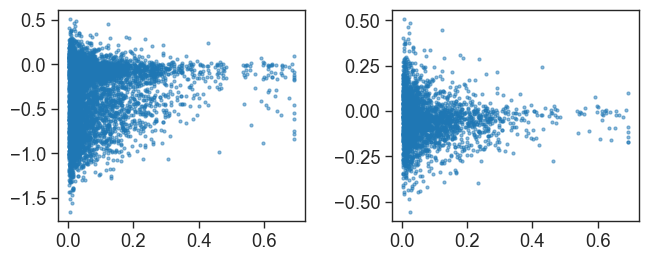

In [355]:
# plot slope vs gene_nonzero_rate
fig, axes = plt.subplots(1, 2, figsize=(7.5, 2.75))
# plot the scatter plot with light blue
temp_df = gene_corr_df[gene_corr_df["method"] == "STADiffuser"]
not axes[0].scatter(gene_corr_df["gene_nonzero_rate"], gene_corr_df["slope"], color="#1f77b4",
           alpha=0.5, s=5)
print(scipy.stats.pearsonr(temp_df["gene_nonzero_rate"], temp_df["slope"]))
temp_df = gene_corr_df[gene_corr_df["method"] == "SRTSim"]
axes[1].scatter(temp_df["gene_nonzero_rate"], temp_df["slope"], color="#1f77b4",
                s=5, alpha=0.5)
print(scipy.stats.pearsonr(temp_df["gene_nonzero_rate"], temp_df["slope"]))
# set subplots horizontal margin
plt.subplots_adjust(wspace=0.35)
# save to disk
fig.savefig("{}/slope_vs_gene_nonzero_rate.png".format(figure_dir), dpi=600)

In [281]:
temp_df = gene_corr_df[gene_corr_df["method"] == "SRTSim"]
# find slope smaller than 0, greater than -0.5 and gene_nonzero_rate greater than 0.2
temp_gene_df = temp_df[(temp_df["slope"] < -0.25) & (temp_df["gene_nonzero_rate"] > 0.1)]
temp_gene_df

,0.1,0.2,0.3,0.4,0.5,0.6,0.8,slope,method,gene_nonzero_rate
FAAH,0.509599,0.508750,0.486552,0.441664,0.494861,0.417902,0.289313,-0.285376,SRTSim,0.117556
JAK1,0.782144,0.769705,0.754597,0.763376,0.728357,0.708843,0.566871,-0.273044,SRTSim,0.178135
CNN3,0.714631,0.674195,0.644174,0.629398,0.594786,0.532677,0.424631,-0.395862,SRTSim,0.232254
HTT,0.724547,0.696093,0.683701,0.663472,0.654818,0.610262,0.458306,-0.339259,SRTSim,0.163888
FRG1,0.357354,0.350760,0.361100,0.363624,0.307526,0.280096,0.144891,-0.285949,SRTSim,0.128381
PSD2,0.510180,0.481121,0.483341,0.468139,0.475014,0.428648,0.296300,-0.260371,SRTSim,0.173245
ID4,0.603225,0.582306,0.572051,0.539006,0.530642,0.481870,0.349816,-0.337203,SRTSim,0.116260
NLGN3,0.287561,0.282533,0.249871,0.153458,0.144122,0.112516,0.089780,-0.326445,SRTSim,0.160666
CCAR2,0.333234,0.310859,0.289304,0.260204,0.262039,0.289933,0.094546,-0.273547,SRTSim,0.182273
FAM92A,0.507726,0.509523,0.518488,0.500277,0.445160,0.380482,0.335594,-0.277981,SRTSim,0.122726


In [314]:
gene_corr_df[gene_corr_df.index == "GAD1"]

,0.1,0.2,0.3,0.4,0.5,0.6,0.8,slope,method,gene_nonzero_rate
GAD1,0.916036,0.913781,0.887315,0.853289,0.857438,0.752727,0.630117,-0.404430,STADiffuser,0.284252
GAD1,0.818640,0.810330,0.795710,0.763469,0.750548,0.750038,0.681969,-0.189641,SRTSim,0.284252


--------------------
Remove 343 nodes and 3812 edges from the original data
--------------------
Remove 685 nodes and 7190 edges from the original data
--------------------
Remove 1709 nodes and 15030 edges from the original data
--------------------
Remove 2741 nodes and 19174 edges from the original data
ad_ind 0
ad_ind 1
ad_ind 4
ad_ind 6
STADiffuser:  GAD1 [0.9160361955130749, 0.9137814636830374, 0.8574375711744295, 0.6301171992481236]
SRTSim:  GAD1 [0.8186398362350297, 0.8103299347341789, 0.7505479589620014, 0.6819691153834357]
--------------------
Remove 343 nodes and 3812 edges from the original data
--------------------
Remove 685 nodes and 7190 edges from the original data
--------------------
Remove 1709 nodes and 15030 edges from the original data
--------------------
Remove 2741 nodes and 19174 edges from the original data
ad_ind 0
ad_ind 1
ad_ind 4
ad_ind 6
STADiffuser:  MAP2K1 [0.9090802678310994, 0.8581324945204827, 0.7884719786616903, 0.54016429035827]
SRTSim:  MAP2K1 [

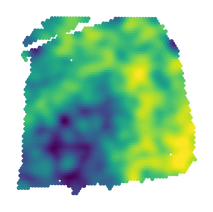

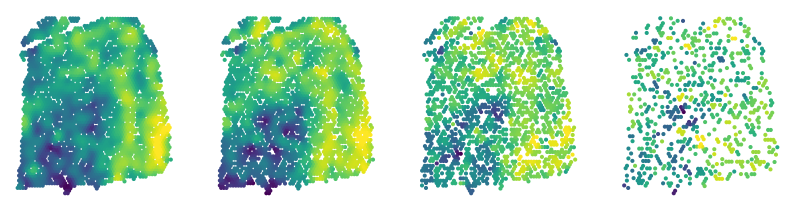

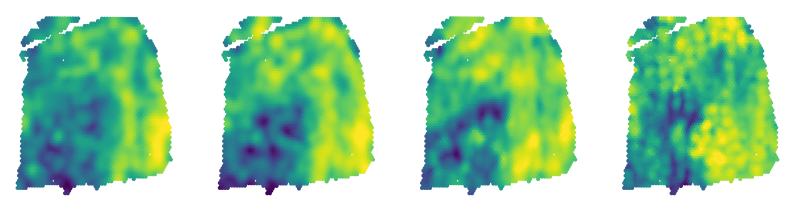

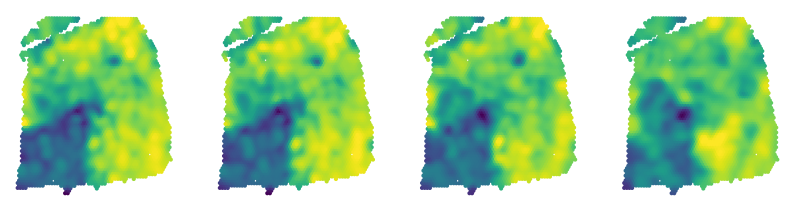

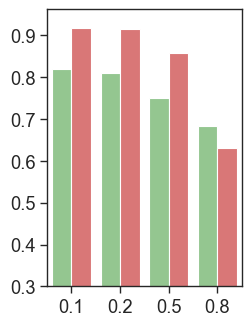

...

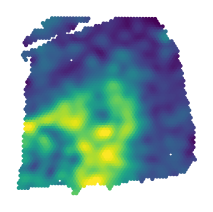

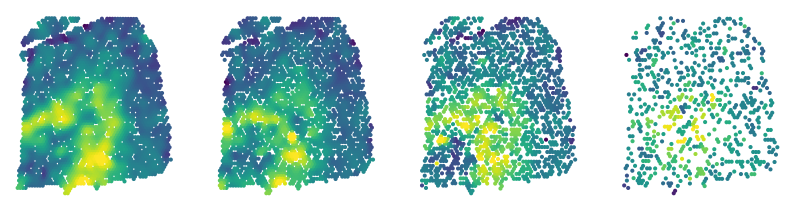

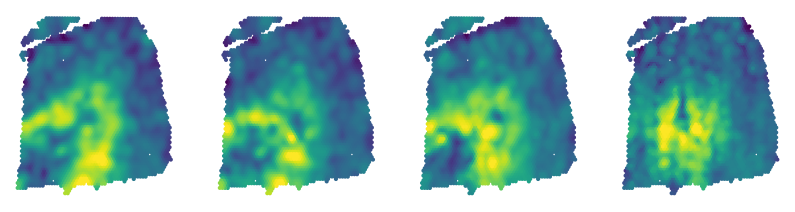

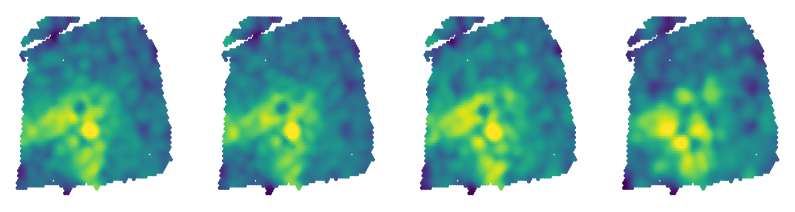

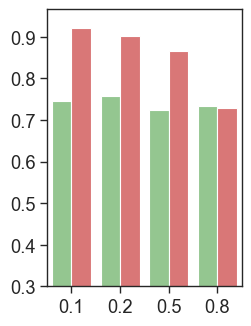

In [342]:
gene_names = ["GAD1", "MAP2K1", "B3GALT2", "KRT17"]
plot_rates = [0.1, 0.2, 0.5, 0.8]
factor = 0.8
dot_size = 35
# create a text to save the correlation
with open("{}/imputation_summary.txt".format(output_dir), "w") as f:
    f.write("Gene\tMissing rate\tSTADiffuser\tSRTSim\n")
# plot gene spatial expression w.r.t missing rate
for gene_name in gene_names:
    n_plots = len(plot_rates)
    # plot ground truth
    fig, ax = plt.subplots(1, 1, figsize=(2.5, 2.5))
    sc.pl.embedding(upside_down(adata_real_recon), basis="spatial", color=gene_name, ax=ax,
                    show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
    # remove colorbar and set title empty
    ax.collections[0].colorbar.remove()
    ax.set_title("")
    # save to disk
    fig.savefig("{}/embedding_{}_gt.png".format(figure_dir, gene_name), dpi=600)
    # plot the observed
    fig, axes = plt.subplots(1, n_plots, figsize=(n_plots * 2.5, 2.5))
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        obs_adata = adata.copy()
        obs_adata = mask_region(obs_adata, "random_{}".format(missing_rate))
        # read autoencoder
        autoencoder_masked = torch.load("{}/{}/autoencoder_attn2.pth".format(output_dir, "random_{}".format(missing_rate)),
                                        map_location="cuda:0").to(device)
        # prepare the dataset
        data = pipeline.prepare_dataset(obs_adata, device=device, use_net="spatial_net")
        # get the reconstruction
        obs_adata_recon = get_recon(obs_adata, autoencoder_masked, device=device, use_net="spatial_net",
                                    apply_normalize=False)
        obs_adata_recon.var_names = adata.var_names
        sc.pl.embedding(upside_down(obs_adata_recon), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
    # save to disk
    fig.savefig("{}/embedding_{}_obs.png".format(figure_dir, gene_name), dpi=600)
    # plot stadiff recovered
    fig, axes = plt.subplots(1, n_plots, figsize=(n_plots * 2.5, 2.5))
    stadiff_corr = []
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        print("ad_ind", ad_ind)
        sim_adata = stadiff_sim_list[ad_ind]
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sc.pl.embedding(upside_down(sim_adata), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
        # compute the correlation
        stadiff_corr.append(scipy.stats.pearsonr(sim_adata.X[:, adata.var_names == gene_name].flatten(),
                                                 adata_real_recon.X[:, adata.var_names == gene_name].flatten())[0])
    fig.savefig("{}/embedding_{}_stadiff.png".format(figure_dir, gene_name), dpi=600)
    print("STADiffuser: ", gene_name, stadiff_corr)
    # plot srt recovered
    fig, axes = plt.subplots(1, len(plot_rates), figsize=(len(plot_rates) * 2.5, 2.5))
    srt_corr = []
    for ax_ind, missing_rate in enumerate(plot_rates):
        ad_ind = missing_rates.index(missing_rate)
        sim_adata = srt_sim_recon_list[ad_ind]
        sim_adata.obsm["spatial"] = adata.obsm["spatial"]
        sim_adata.var_names = adata.var_names
        sc.pl.embedding(upside_down(sim_adata), basis="spatial", color=gene_name, ax=axes[ax_ind],
                        show=False, wspace=0.05, frameon=False, cmap="viridis", vmax="p99.5", size=dot_size)
        axes[ax_ind].collections[0].colorbar.remove()
        axes[ax_ind].set_title("")
        # compute the correlation
        srt_corr.append(scipy.stats.pearsonr(sim_adata.X[:, adata.var_names == gene_name].flatten(),
                                             adata_real_recon.X[:, adata.var_names == gene_name].flatten())[0])
    fig.savefig("{}/embedding_{}_srt.png".format(figure_dir, gene_name), dpi=600)
    print("SRTSim: ", gene_name, srt_corr)
    # plot barplot
    fig, ax = plt.subplots(1, 1, figsize=(2.75, 3.5))
    missing_corr_df = pd.DataFrame({"missing_rate": np.tile(plot_rates, 2),
                                    "method": np.repeat(["STADiffuser", "SRTSim"], len(plot_rates)),
                                    "gene_corr": np.concatenate([stadiff_corr, srt_corr])})
    sns.barplot(data=missing_corr_df, x="missing_rate", y="gene_corr", hue="method", ax=ax,
                palette=plot_palette, hue_order=["SRTSim", "STADiffuser"])
    # remove legend
    ax.set_ylim(0.3, np.max(stadiff_corr) * 1.05)
    ax.legend().remove()
    ax.set_xlabel("")
    ax.set_ylabel("")
    plt.tight_layout()
    fig.savefig("{}/sr_barplot_{}.png".format(figure_dir, gene_name), dpi=600)
    # write to file
    with open("{}/imputation_summary.txt".format(output_dir), "a") as f:
        for ind, missing_rate in enumerate(plot_rates):
            f.write("{}\t{}\t{:.3f}\t{:.3f}\n".format(gene_name, missing_rate, stadiff_corr[ind], srt_corr[ind]))
        for ind, missing_rate in enumerate(plot_rates):
            f.write("{}\t{}\t{:.3f}\t{:.3f}\n".format(gene_name, missing_rate, stadiff_corr[ind], srt_corr[ind]))

In [331]:
np.repeat(["STADiffuser", "SRTSim"], len(plot_rates))

array(['STADiffuser', 'STADiffuser', 'STADiffuser', 'STADiffuser',
       'SRTSim', 'SRTSim', 'SRTSim', 'SRTSim'], dtype='<U11')

Text(0, 0.5, '')

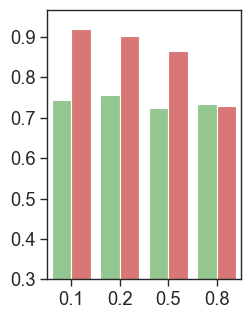

In [339]:
# plot the bar plot srt_corr_list and stadiff_corr_list for gene_name


# Multiuple Sample simulation

In [7]:
from stadiffuser.utils import cal_spatial_net3D
import stadiffuser.pipeline as pipeline
slice_ids = os.listdir(DLPFC_DIR)
all_genes = []
for slice_id in slice_ids:
    adata = sc.read_visium(os.path.join(DLPFC_DIR, slice_id),
                           count_file=slice_id + "_filtered_feature_bc_matrix.h5", )
    all_genes.append(adata.var_names.tolist())
all_genes = list(set.intersection(*map(set, all_genes)))
print(len(all_genes))

33514


In [137]:
adata

AnnData object with n_obs × n_vars = 3431 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'ground_truth', 'circle-1', 'circle-2', 'circle-3', 'rectangle-1', 'rectangle-2', 'rectangle-3', 'extrapolation-1', 'extrapolation-2', 'extrapolation-3', 'random_0.05', 'random_0.1', 'random_0.2', 'random_0.3', 'random_0.4', 'random_0.5', 'random_0.6', 'random_0.8', 'random_0.9', 'strip'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ground_truth_colors', 'hvg', 'log1p', 'spatial', 'spatial_net', 'edge_list'
    obsm: 'spatial', 'new_spatial'

In [30]:
slice_id = slice_ids[0]
adata_list = [load_slice_data(slice_id, top_genes=3000, return_raw=False) for slice_id in slice_ids]
selected_genes = [adata.var_names.tolist() for adata in adata_list]
# select the common genes
selected_genes = list(set.union(*map(set, selected_genes)))

In [31]:
len(selected_genes)

12370

In [32]:
# compute the intersection of genes of adjacent slices
adj_genes = []
for i in range(len(adata_list) - 1):
    adata1 = adata_list[i]
    adata2 = adata_list[i + 1]
    genes1 = adata1.var_names.tolist()
    genes2 = adata2.var_names.tolist()
    adj_genes.append(list(set(genes1).intersection(set(genes2))))
    print("Slice {} and {} have {} common genes".format(i, i + 1, len(adj_genes[-1])))
adj_genes = list(set.union(*map(set, adj_genes)))

Slice 0 and 1 have 1180 common genes
Slice 1 and 2 have 1175 common genes
Slice 2 and 3 have 1184 common genes
Slice 3 and 4 have 998 common genes
Slice 4 and 5 have 1022 common genes
Slice 5 and 6 have 870 common genes
Slice 6 and 7 have 1245 common genes
Slice 7 and 8 have 1050 common genes
Slice 8 and 9 have 1155 common genes
Slice 9 and 10 have 1162 common genes
Slice 10 and 11 have 1140 common genes


In [33]:
# compute the adj genes appeared in all slices and retain the top 3000 most frequent genes
adj_genes_count = {}
for i in range(len(adata_list)):
    adata = adata_list[i]
    genes = adata.var_names.tolist()
    for gene in genes:
        if gene in adj_genes:
            if gene not in adj_genes_count:
                adj_genes_count[gene] = 1
            else:
                adj_genes_count[gene] += 1
adj_genes_count = sorted(adj_genes_count.items(), key=lambda x: x[1], reverse=True)
# intersect with all genes
adj_genes_count = [x[0] for x in adj_genes_count if x[0] in all_genes]

In [34]:
# select the top 3000 genes
adj_genes_count = adj_genes_count[:3000]
len(adj_genes_count)

3000

In [35]:
adata_list = []
for slice_id in slice_ids:
    adata = sc.read_visium(os.path.join(DLPFC_DIR, slice_id),
                           count_file=slice_id + "_filtered_feature_bc_matrix.h5", )
    adata.var_names_make_unique()
    labels = pd.read_csv(os.path.join(DLPFC_DIR, slice_id, slice_id + "_truth.txt"), index_col=0, header=None, sep="\t")
    adata.obs["ground_truth"] = labels.iloc[:, 0].values
    adata = adata[:, adata.var_names.isin(adj_genes_count)]
    adata.obs["slice_id"] = slice_id
    adata_list.append(adata)
adata_all = adata_list[0].concatenate(adata_list[1:], batch_key="slice_id")

In [37]:
sc.pp.normalize_total(adata_all, target_sum=1e4)
sc.pp.log1p(adata_all)
adata_all.X.max()
adata = cal_spatial_net3D(adata_all, batch_id="slice_id", iter_comb=None, rad_cutoff=150,
                              add_key="spatial_net")

------Calculating spatial network for each batch...
Calculating spatial network for batch 0...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 24770 edges, 4226 cells, 5.8613 neighbors per cell on average.
Calculating spatial network for batch 1...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 25698 edges, 4384 cells, 5.8618 neighbors per cell on average.
Calculating spatial network for batch 2...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 28172 edges, 4789 cells, 5.8826 neighbors per cell on average.
Calculating spatial network for batch 3...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 27198 edges, 4634 cells, 5.8692 neighbors per cell on average.
Calculating spatial network for batch 4...
------Calculating spatial graph...
------Spatial graph calculated.
The graph contains 21194 edges, 3661 cells, 5.7891 neighbors per cell 

In [40]:
import stadiffuser.utils as utils
spatial_data = adata.obsm["spatial"].copy()
new_spatial_data = utils.quantize_coordination(spatial_data,  methods=[("division", 125), ("division", 125)])
adata.obsm["spatial_new"] = new_spatial_data

Quantizing spatial coordinates...
Quantize 0th dimension of spatial coordinates to 0.008, mean deviation: 0.2500516348230952, pearson correlation: 0.9998812956984209
Quantize 1th dimension of spatial coordinates to 0.008, mean deviation: 0.24802634172941004, pearson correlation: 0.9998902295766868


In [12]:
data = pipeline.prepare_dataset(adata, use_net="spatial_net", use_spatial="spatial_new", device=device)

In [13]:
from stadiffuser.dataset import get_slice_loader
from tqdm.auto import tqdm

In [14]:
from stadiffuser.vae import SpaAE
import torch.nn.functional as F

model = SpaAE(input_dim=3000,
               block_list=["ResBlock"],
               gat_dim=[512, 32],
               block_out_dims=[32, 32]).to(device)
n_epochs =  500
train_loaders = [get_slice_loader(adata, data, str(ind), use_batch="slice_id", batch_size=64) for ind in range(len(slice_ids))]
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
loss_list = []
pbar = tqdm(range(n_epochs))
model.train()
for epoch in range(1, n_epochs + 1):
    for train_loader in train_loaders:
        for batch in train_loader:
            optimizer.zero_grad()
            z, out = model(batch.x, batch.edge_index)
            loss = F.mse_loss(out, batch.x)
            loss_list.append(loss.item())
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5)
            optimizer.step()
            loss_list.append(loss.item())
            pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
    scheduler.step()
    pbar.update(1)
#  save model to disk

  0%|          | 0/500 [00:00<?, ?it/s]

In [16]:
torch.save(model, "../output/App1-DLPFC/multi-slice/autoencoder_pretrained.pth")

[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'slice_id'}, xlabel='UMAP1', ylabel='UMAP2'>]

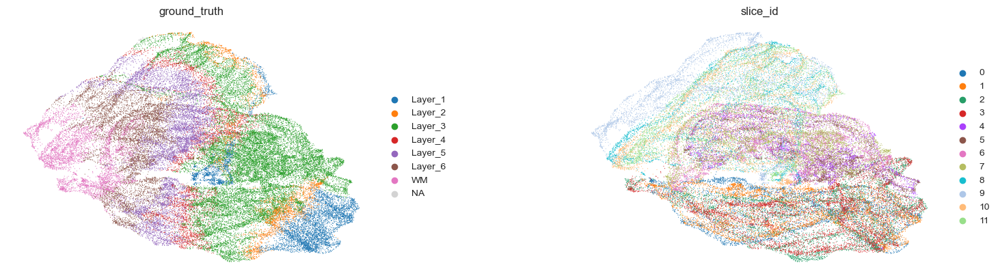

In [17]:
# perform umap
with torch.no_grad():
    latent, recon_X = model(data.x.to(device), data.edge_index.to(device))
adata.obsm["latent"] = latent.detach().cpu().numpy()
sc.pp.neighbors(adata, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata, min_dist=0.5)
sc.pl.umap(adata, color=["ground_truth", "slice_id"], ncols=2, frameon=False, wspace=0.4, use_raw=False, show=False)

In [18]:
train_loaders = []
index_mappings = []
used_batches = adata.obs["slice_id"].unique().tolist()
iter_combs = [(i, i+1) for i in range(len(used_batches)-1)]
for batch_name in used_batches:
    num_spots = int((adata.obs["slice_id"] == batch_name).values.sum())
    loader = get_slice_loader(adata, data, batch_name, batch_size=num_spots, use_batch="slice_id")
    train_loaders.append(loader)
    batch = next(iter(loader))
    index_mappings.append({val.item(): idx for idx, val in enumerate(batch.n_id)})

In [21]:
# triplet loss for alignment of latent space
import torch.nn as nn
from stadiffuser.dataset import TripletSampler

n_epochs = 500
pbar = tqdm(range(n_epochs))
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
triplet_loss = nn.TripletMarginLoss(margin=1, p=2)
update_mnn_eval = 100

for epoch in range(1, n_epochs + 1):
    if epoch % update_mnn_eval == 1:
        # update the representation
        print("Updating the representation")
        with torch.no_grad():
            latent, recon_X = model(data.x.to(device), data.edge_index.to(device))
        adata.obsm["latent"] = latent.detach().cpu().numpy()
        tri_samplers = []
        for (target_id, ref_id) in iter_combs:
            tri_samplers.append(TripletSampler(adata, data, target=used_batches[target_id],
                                               use_rep="latent",
                                               reference=used_batches[ref_id],
                                               use_batch="slice_id",
                                               num_neighbors=15))
    for ind, (target_id, ref_id) in enumerate(iter_combs):
        optimizer.zero_grad()
        target_batch = next(iter(train_loaders[target_id]))
        reference_batch = next(iter(train_loaders[ref_id]))
        z_target, out_target = model(target_batch.x, target_batch.edge_index)
        z_reference, out_reference = model(reference_batch.x, reference_batch.edge_index)
        anchor_indices, positive_indices, negative_indices = tri_samplers[ind].query(target_batch.n_id.detach().cpu().numpy())
        anchor_indices = [index_mappings[target_id][i] for i in anchor_indices]
        positive_indices =  [index_mappings[ref_id][i] for i in positive_indices]
        negative_indices = [index_mappings[target_id][i] for i in negative_indices]
        loss_rmse = F.mse_loss(out_target, target_batch.x) * .5 + F.mse_loss(out_reference, reference_batch.x) * .5
        z_a = z_target[anchor_indices]
        z_p = z_reference[positive_indices]
        z_n = z_target[negative_indices]
        loss_tri = triplet_loss(z_a, z_p, z_n)
        loss = loss_tri + loss_rmse
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 5)
        optimizer.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
        loss_list.append(loss.item())
        scheduler.step()
    pbar.update(1)
torch.save(model, "../output/App1-DLPFC/multi-slice/autoencoder_aligned.pth")

  0%|          | 0/500 [00:00<?, ?it/s]

Updating the representation
Updating the representation
Updating the representation
Updating the representation
Updating the representation


[<Axes: title={'center': 'ground_truth'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'slice_id'}, xlabel='UMAP1', ylabel='UMAP2'>]

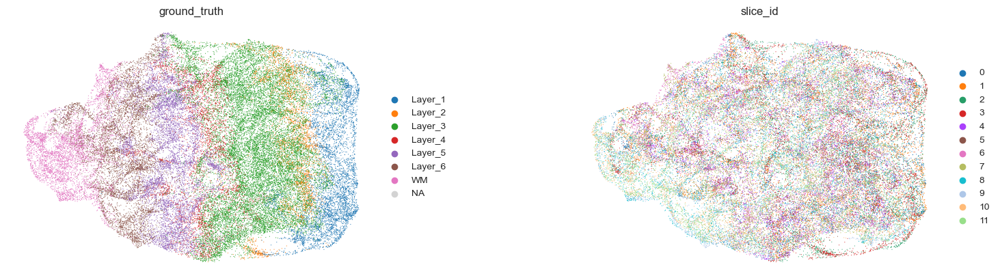

In [22]:
# perform umap
with torch.no_grad():
    latent, recon_X = model(data.x.to(device), data.edge_index.to(device))
adata.obsm["latent"] = latent.detach().cpu().numpy()
sc.pp.neighbors(adata, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata, min_dist=0.5)
sc.pl.umap(adata, color=["ground_truth", "slice_id"], ncols=2, frameon=False, wspace=0.4, use_raw=False, show=False)

In [25]:
adata

AnnData object with n_obs × n_vars = 47681 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'ground_truth', 'slice_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p', 'spatial_net', 'neighbors', 'umap', 'ground_truth_colors', 'slice_id_colors'
    obsm: 'spatial', 'spatial_new', 'latent', 'X_umap'
    obsp: 'distances', 'connectivities'

In [27]:
# train the denoiser
from stadiffuser.dataset import NeighborLoader
normalizer = stutils.MinMaxNormalize(adata.obsm["latent"], dim=0)
adata.obsm["normalized_latent"] = normalizer.normalize(adata.obsm["latent"])
data_latent = pipeline.prepare_dataset(adata, use_rep="normalized_latent", use_spatial="spatial_new",
                                       use_net="spatial_net")
train_loader = NeighborLoader(data_latent, num_neighbors=[5, 3], batch_size=64)
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
denoiser_ckpt = [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1200, 1500]
denoiser = SpaUNet1DModel(in_channels=17, out_channels=1).to(device)
denoiser, denoise_loss = pipeline.train_denoiser(train_loader, denoiser, noise_scheduler,
                                                 lr=1e-4, weight_decay=1e-6,
                                                 n_epochs=2000,
                                                 save_dir="../output/App1-DLPFC/multi-slice", device=device, check_points=denoiser_ckpt)

  0%|          | 0/2000 [00:00<?, ?it/s]

 Save model to ../output/App1-DLPFC/multi-slice\denoiser.pth.pth
-------------------Training Finished-------------------


In [43]:
# load the denoiser
import torch
from diffusers.schedulers import DDPMScheduler
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
denoiser = torch.load("../output/App1-DLPFC/multi-slice/denoiser.pth").to(device)

In [58]:
sim_spatial = adata.obsm["spatial_new"][adata.obs["slice_id"] == "1"].copy()
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
# generate simulated data
simulated_latent = pipeline.simulate(denoiser, noise_scheduler=noise_scheduler,
                                spatial_coord=torch.from_numpy(sim_spatial).to(device), n_features=32,
                                device=device, seed=2023, progress=True)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [59]:
adata_sim = adata[adata.obs["slice_id"] == "1"].copy()
adata_sim.obsm["latent"] = simulated_latent.detach().cpu().numpy()
sc.pp.neighbors(adata_sim, use_rep="latent", n_neighbors=30)
sc.tl.umap(adata_sim, min_dist=0.5)
# apply mcluster
sc.tl.leiden(adata_sim, key_added="leiden", resolution=0.3)


fitting ...
  |======================================================================| 100%


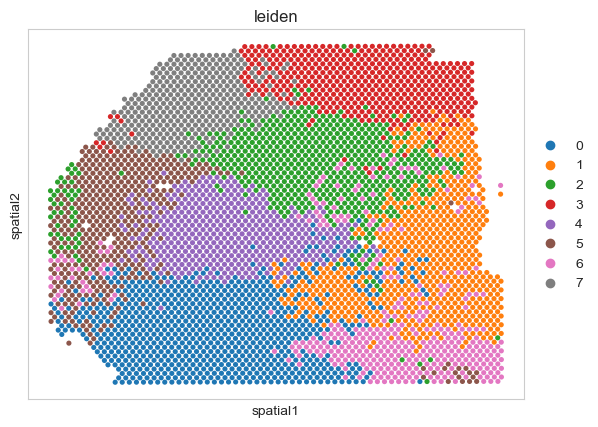

In [60]:
# sc.pl.umap(adata_sim, color=["leiden"], ncols=1, frameon=False, wspace=0.4, use_raw=False, show=False)
#  visualize
import pandas as pd
from stadiffuser.analytics import mclust_R
os.environ["R_HOME"] = r"D:\Program Files\R\R-4.0.3"
adata_sim = mclust_R(adata_sim, 7, use_rep="latent")

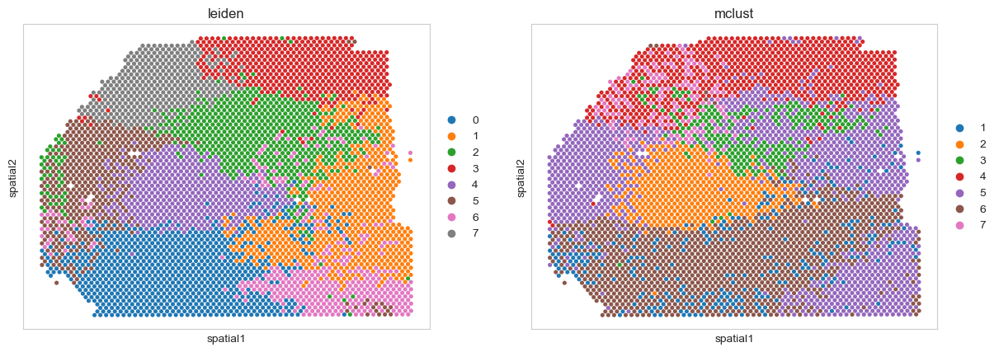

In [61]:
sc.pl.embedding(adata_sim, basis="spatial", color=["leiden", "mclust"], cmap="viridis", vmax="p99.5", size=55)

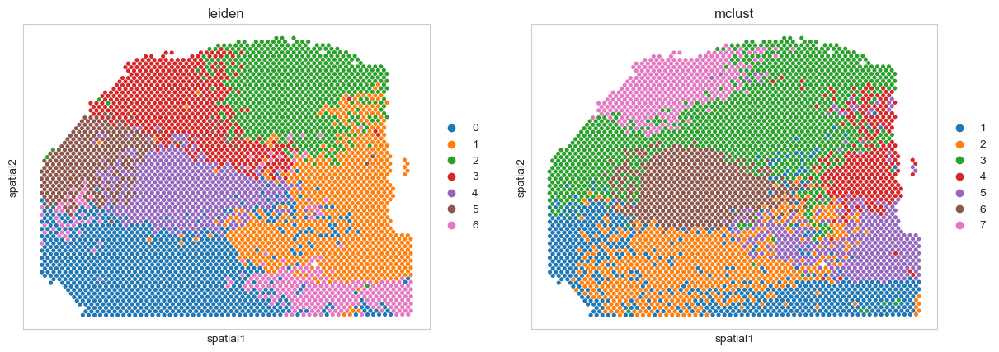